In [ ]:
# https://pypi.org/project/PypeR/#description

In [9]:
import pandas as pd
rnb = pd.read_csv('rnb1015_2 AllVars.csv')
rnb.head()
rnb_AMR = rnb[(rnb.region == 'AMR') & (rnb.marketing == 'Paid')]
rnb_AMR = rnb_AMR.reset_index().drop(columns=['index'])
X = rnb_AMR['nb']
X.head()

0     741
1     993
2    1281
3    1391
4    1510
Name: nb, dtype: int64

In [150]:
import pandas as pd
rnb = pd.read_csv('rnb1015_2 AllVars.csv')
rnb.head()
rnb_AMR = rnb[(rnb.region == 'AMR') & (rnb.marketing == 'Paid')]
#rnb_AMR = rnb_AMR.reset_index().drop(columns=['index'])
X = rnb_AMR['nb']
X.head()

1      741
11     993
21    1281
31    1391
41    1510
Name: nb, dtype: int64

In [19]:
import pandas as pd
data = pd.read_csv('test_data_6m.csv')
#data = pd.read_csv('NA_NB_1_20181126.csv')
#data = pd.read_csv('rnb1015_2_All.csv')
data.shape
data.head()

,Date,RLT Marketing Channel,nb
0,7/1/17,Undefined,1225
1,7/1/17,Direct,1732
2,7/1/17,Display,256
3,7/1/17,Email,1262
4,7/1/17,Partner,885


In [193]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1840 entries, 0 to 1839
Data columns (total 3 columns):
Date                     1840 non-null object
RLT Marketing Channel    1840 non-null object
nb                       1840 non-null int64
dtypes: int64(1), object(2)
memory usage: 43.2+ KB


In [55]:
import pandas as pd
aws_eu = pd.read_csv('/Users/akuppam/Documents/Hprog/Py/rPy/AWS/EU_Paid_Spend_20190122.csv')
aws_eu.head()
data = aws_eu[['Date', 'Spend Amount USD']]
data.columns = ['ds', 'y']
data.head()

,ds,y
0,1/1/16,34350
1,1/2/16,64249
2,1/3/16,89417
3,1/4/16,97478
4,1/5/16,93398


In [94]:
# -------------------------------------
# Run Arima & Sarima for EU/AMR paid/not paid
# -------------------------------------

import pandas as pd
data = pd.read_csv('/Users/akuppam/Documents/Hprog/Py/rPy/AWS/NA_Paid_Spend_20190122.csv')
#data = pd.read_csv('/Users/akuppam/Documents/Hprog/Py/rPy/AWS/EU_Paid_Spend_20190122.csv')
#data = pd.read_csv('/Users/akuppam/Documents/Hprog/Py/rPy/AWS/NA_NotPaid_20190122.csv')
#data = pd.read_csv('/Users/akuppam/Documents/Hprog/Py/rPy/AWS/EU_NotPaid_20190122.csv')
data = data[['Date', 'Net Bookings', 'Spend Amount USD']]
#data = data[['Date', 'NB']]
data.columns = ['ds', 'y', 'aws']
#data.columns = ['ds', 'y']
data.head()

,ds,y,aws
0,1/1/16,817,61842
1,1/2/16,1119,79724
2,1/3/16,1429,89523
3,1/4/16,1562,84218
4,1/5/16,1696,89471


In [87]:
import pandas as pd
import pyper as pr

def r_ArimaFxn(data, fcstdays):
    #X = data['nb']
    r = pr.R()
    r.assign("rDF", data)
    r.assign("h", fcstdays)
    r("library(forecast)")
    r("model_order <- auto.arima(rDF$y, seasonal = T)")
    r("ts_data <- ts(rDF$y, start=2016,freq=365)")
    #r("summary(ts_data)")
    r("fit <- stlm(ts_data, modelfunction=Arima, order=arimaorder(model_order))")
    r("fit_arima_fc <- forecast(fit, h=h)")
    r("df_arima <- c(fit_arima_fc$fitted, fit_arima_fc$mean)")
    r_arima_series = pd.DataFrame(r.get("df_arima"))
    r_arima_series = r_arima_series[0].values
    #print(r_arima_series)
    return r_arima_series

In [81]:
amr_nb_notpaid_arima = r_ArimaFxn(data, 374)

In [82]:
amr_nb_notpaid_arima

array([1411.68096782, 1550.17929935, 2072.38075319, ..., 3926.36758291,
       3609.57087466, 3411.67125737])

In [83]:
amr_nb_notpaid_arima = pd.DataFrame(amr_nb_notpaid_arima)
amr_nb_notpaid_arima.to_csv("amr_nb_notpaid_arima.csv")

In [95]:
import pandas as pd
import pyper as pr

def r_SarimaFxn(data, fcstdays):
    #X = X['y'].values
    r = pr.R()
    r.assign("rDF", data)
    r.assign("h", fcstdays)
    r("library(forecast)")
    r("ts_data <- ts(rDF$y, start=2016,freq=365)")
    r("model_sorder <- auto.arima(ts_data, D=1)")
    r("asorder <- model_sorder$arma[c(1, 6, 2, 3, 7, 4, 5)]")
    r("names(asorder) <- c('p', 'd', 'q', 'P', 'D', 'Q', 'Frequency')")
    r("model_fit_s <- stlm(ts_data, modelfunction=Arima,order=c(asorder[1],asorder[2],asorder[3]),seasonal=list(order=c(asorder[4],asorder[5],asorder[6])))")
    r("fit_sarima_fc <- forecast(model_fit_s, h=h)")    
    r("df_sarima <- c(fit_sarima_fc$fitted, fit_sarima_fc$mean)")
    r_sarima_series = pd.DataFrame(r.get("df_sarima"))
    r_sarima_series = r_sarima_series[0].values
    r_sarima_series = pd.Series(r_sarima_series)
    return r_sarima_series

In [96]:
amr_nb_paid_sarima = r_SarimaFxn(data, 374)
amr_nb_paid_sarima = pd.DataFrame(amr_nb_paid_sarima)
amr_nb_paid_sarima.to_csv("amr_nb_paid_sarima.csv")

In [39]:
import pandas as pd
rnb = pd.read_csv('amr_total.csv')
rnb.head()
rnb_AMR = rnb.reset_index().drop(columns=['index'])
X = rnb_AMR['real']
X.head()

0     6241.0
1     7506.0
2     8883.0
3    10262.0
4    11338.0
Name: real, dtype: float64

In [28]:
fcstdays = 442
r = pr.R()
r.assign("rDF", X)
r.assign("h", fcstdays)
r("library(forecast)")
r("model_order <- auto.arima(rDF, seasonal = T)")
r("ts_data <- ts(rDF, start=2016,freq=365)")
r("fit <- stlm(ts_data, modelfunction=Arima, order=arimaorder(model_order))")
r("fit_arima_fc <- forecast(fit, h=h)")
r("df_arima <- c(fit_arima_fc$fitted, fit_arima_fc$mean)")
r_arima_series = pd.DataFrame(r.get("df_arima"))
r("t <- as.numeric(fit_arima_fc$mean)")
r("write.csv(t, 'fit_arima_fc.csv')")
r("t <- as.numeric(fit_arima_fc$upper[,1])")
r("write.csv(t, 'fit_arima_fc_hi_80.csv')")
r("t <- as.numeric(fit_arima_fc$upper[,2])")
r("write.csv(t, 'fit_arima_fc_hi_95.csv')")
r("t <- as.numeric(fit_arima_fc$lower[,1])")
r("write.csv(t, 'fit_arima_fc_lo_80.csv')")
r("t <- as.numeric(fit_arima_fc$lower[,2])")
r("write.csv(t, 'fit_arima_fc_lo_95.csv')")

"try({write.csv(t, 'fit_arima_fc_lo_95.csv')})\n"

In [29]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib

matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

# Data manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Set a few plotting defaults
%matplotlib inline
plt.style.use('fivethirtyeight')
plt.rcParams['font.size'] = 18
plt.rcParams['patch.edgecolor'] = 'k'

pd.options.display.max_columns = 150

In [46]:
import pandas as pd
rnb = pd.read_csv('amr_total.csv')
rnb = rnb.dropna(axis=0)
rnb.tail()

,date,real
1014,10/11/18,11018.0
1015,10/12/18,9494.0
1016,10/13/18,9529.0
1017,10/14/18,12013.0
1018,10/15/18,11806.0


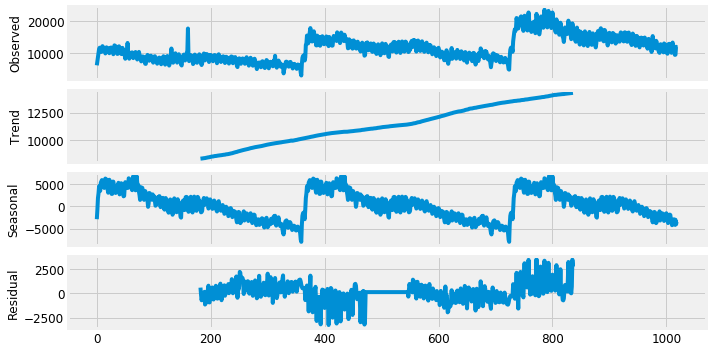

In [51]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

rnbld = sm.tsa.seasonal_decompose(rnb['real'], model='additive', freq = 365)
fig = rnbld.plot()
plt.show()

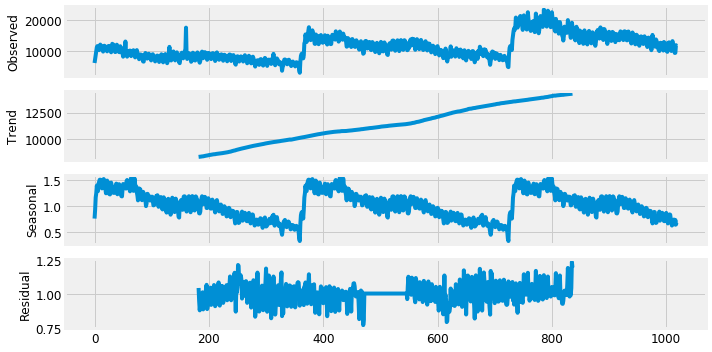

In [52]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

rnblm = sm.tsa.seasonal_decompose(rnb['real'], model='multiplicative', freq = 365)
fig = rnblm.plot()
plt.show()

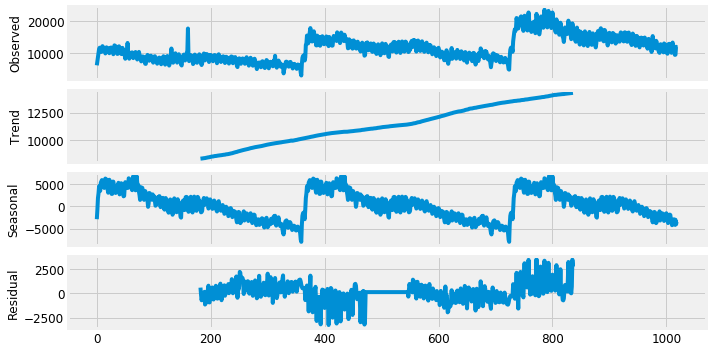

In [53]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

rnbld = sm.tsa.seasonal_decompose(rnb['real'], freq = 365)
fig = rnbld.plot()
plt.show()

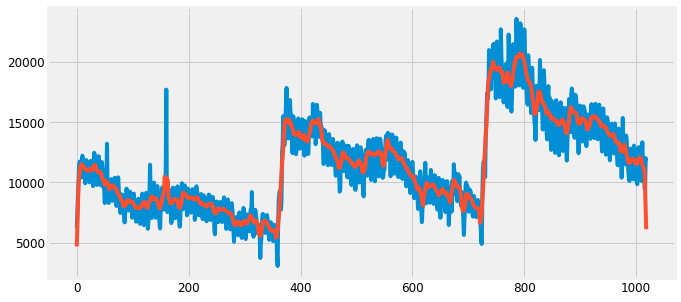

In [55]:
def movingaverage(interval, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return pd.DataFrame(np.convolve(interval, window, 'same'), columns = ['MA'])
plt.plot(rnb['real'])
plt.plot(movingaverage(rnb['real'], 7))
plt.show()

In [62]:
ma = movingaverage(rnb['real'], 7)

In [68]:
x = rnb['real']

In [81]:
m_division = x/ma['MA']

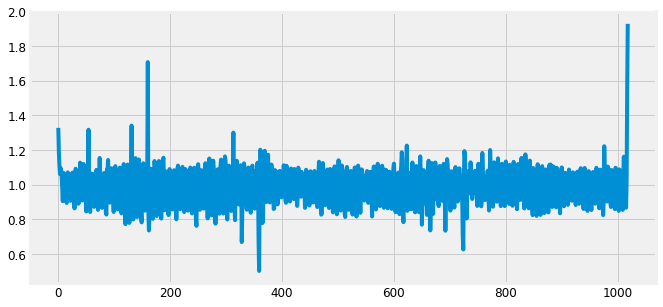

In [82]:
plt.plot(m_division)
plt.show()

In [83]:
m_substract = x-ma['MA']

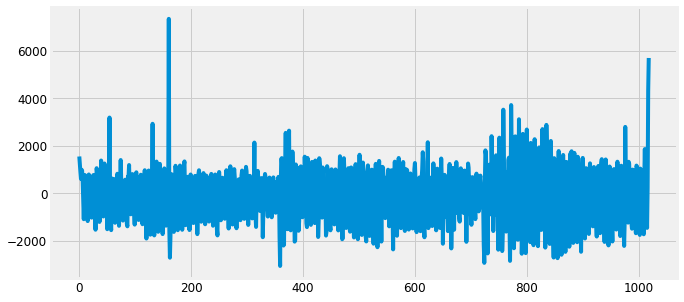

In [84]:
plt.plot(m_substract)
plt.show()

In [6]:
import pandas as pd
import pyper as pr

In [21]:
import pandas as pd
rnb = pd.read_csv('rnb1015_2 AllVars.csv')
rnb.head()
rnb_AMR = rnb[(rnb.region == 'AMR') & (rnb.marketing == 'Paid')]
rnb_AMR = rnb_AMR.reset_index().drop(columns=['index'])
X = rnb_AMR['nb']
X.head()

0     741
1     993
2    1281
3    1391
4    1510
Name: nb, dtype: int64

In [47]:
import pandas as pd
X = pd.read_csv('test_data_6m.csv')
#data = pd.read_csv('NA_NB_1_20181126.csv')
#data = pd.read_csv('rnb1015_2_All.csv')
X.shape
X.head()
X['nb'].head()

0    1225
1    1732
2     256
3    1262
4     885
Name: nb, dtype: int64

In [48]:
def r_ArimaFxn(X, fcstdays):
    #X = X['y']
    X = X['nb']
    r = pr.R()
    r.assign("rDF", X)
    r.assign("h", fcstdays)
    r("library(forecast)")
    r("model_order <- auto.arima(rDF, seasonal = T)")
    r("ts_data <- ts(rDF, start=2016,freq=365)")
    r("print(ts_data)")
    r("fit <- stlm(ts_data, modelfunction=Arima, order=arimaorder(model_order))")
    r("fit_arima_fc <- forecast(fit, h=h)")
    r("df_arima <- c(fit_arima_fc$fitted, fit_arima_fc$mean)")
    r_arima_series = pd.DataFrame(r.get("df_arima"))
    r_arima_series = r_arima_series[0].values
    return r_arima_series

In [49]:
rfc = r_ArimaFxn(X, 442)

In [50]:
rfc

array([1223.41427408, 1926.3289278 ,  760.82283158, ...,  503.45140225,
       1258.90539871, 1770.59654966])

In [ ]:
    def r_SarimaFxn(self, X, fcstdays):
        X = X['y'].values
        r = pr.R()
        r.assign("rDF", X)
        r.assign("h", fcstdays)
        r("library(forecast)")
        r("ts_data <- ts(rDF, start=2016,freq=365)")
        r("model_sorder <- auto.arima(ts_data, D=1)")
        r("asorder <- model_sorder$arma[c(1, 6, 2, 3, 7, 4, 5)]")
        r("names(asorder) <- c('p', 'd', 'q', 'P', 'D', 'Q', 'Frequency')")
        r("model_fit_s <- stlm(ts_data, modelfunction=Arima,order=c(asorder[1],asorder[2],asorder[3]),seasonal=list(order=c(asorder[4],asorder[5],asorder[6])))")
        r("fit_sarima_fc <- forecast(model_fit_s, h=h)")    
        r("df_sarima <- c(fit_sarima_fc$fitted, fit_sarima_fc$mean)")
        r_sarima_series = pd.DataFrame(r.get("df_sarima"))
        r_sarima_series = r_sarima_series[0].values
        return r_sarima_series

In [ ]:
# testing updated timeseriesmultireg

In [30]:
# -*- coding: utf-8 -*-
"""
Created on Tue Nov  6 14:44:31 2018
Modified on Fri, Dec 14 2018
Modified on Mon, Jan 7 2018
@author: ahellman; akuppam; trenner
"""
import numpy as np
import pandas as pd
import itertools
#import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
#from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from fbprophet import Prophet
#from fbprophet.diagnostics import cross_validation
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
import logging
import warnings
import pyper as pr


log_fmt = '%(asctime)s - %(name)s - %(levelname)s - %(message)s'
logging.basicConfig(level=logging.INFO, format=log_fmt)
logger = logging.getLogger(__name__)


class TimeSeriesMultiReg():
    
    def __init__(self):
        pass
    
    
    def _Run_Regressions(
        self,
        df,
        forecastDays,
        region="None",
        forecasts={"holtwinters", "arima", "sarima", "prophet", "r_arima", "r_sarima"}
    ):
        """This is the main working function to:
            1. break out the arrays from the dataset
            2. Call the other functions
            3. Run the MAPE on each of the functions"""
        
        df = self.format_df(df)
        

        actualsDict = self.dimensionDictionary(df)
        
        actualsDictKey = []
        for key in actualsDict:
            actualsDictKey.append(key)  
        
        # Fill dictionary with unique intersections of the actuals data:
        for i in range(0, len(actualsDictKey)):
            dfFiltered = df.iloc[0:,1].isin(actualsDictKey[i])
            for j in range(1, len(df.columns)-1):
                dfFiltered &= df.iloc[0:,j].isin(actualsDictKey[i])
            
            actualsDict[actualsDictKey[i]] = df[dfFiltered]
        # Fill dictionary with unique uintersections of the actuals data:

        # Dict mapping subdimensions to (model, forecast) tuples.
        # model, forecast = forecast_results[subdimension] <- how to call.
        forecast_results = {}
        
        # If 0 Dims, do this:
        if len(actualsDictKey) == 0:
            actualsDictKey.append('y')
            actualsDict['y'] = df[['y']]
        
        for subDimension in actualsDictKey:
            # Initialize the list of forecast results for the subdimension.
            forecast_results[subDimension] = []
            if "prophet" in forecasts:
                try:
                    if region == "None":
                        forecast_results[subDimension].append((
                            "Prophet",
                            self.ProphetFxnNone(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        ))
                    elif region == "NA":
                        forecast_results[subDimension].append((
                            "Prophet",
                            self.ProphetFxnNA(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        ))
                    elif region == "UK":
                        forecast_results[subDimension].append((
                            "Prophet",
                            self.ProphetFxnUK(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        ))
                    elif region == "FR":
                        forecast_results[subDimension].append((
                            "Prophet",
                            self.ProphetFxnFR(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        ))
                    elif region == "CE":
                        forecast_results[subDimension].append((
                            "Prophet",
                            self.ProphetFxnCE(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        ))
                    elif region == "SoEu":
                        forecast_results[subDimension].append((
                            "Prophet",
                            self.ProphetFxnSoEu(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        ))
                except Exception:
                    pass  # If we can't run this without generating exceptions, skip.
            
            if "holtwinters" in forecasts:
                try:
                    forecast_results[subDimension].append(
                        (
                            "HW",
                            self.HWFxn(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        )
                    )
                except Exception:
                    pass  # If we can't run this without generating exceptions, skip.
            
            if "sarima" in forecasts:
                try:
                    forecast_results[subDimension].append(
                        (
                            "Sarima",
                            self.SarimaFxn(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        )
                    )
                except Exception:
                    pass  # If we can't run this without generating exceptions, skip.
            
            if "r_sarima" in forecasts:
                try:
                    forecast_results[subDimension].append(
                        (
                            "r_Sarima",
                            self.r_SarimaFxn(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        )
                    )
                except Exception:
                    pass  # If we can't run this without generating exceptions, skip.
            
            if "r_arima" in forecasts:
                try:
                    forecast_results[subDimension].append(
                        (
                            "r_Arima",
                            self.r_ArimaFxn(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        )
                    )
                except Exception as e:
                    raise e  # If we can't run this without generating exceptions, skip.
            
            if "arima" in forecasts:
                try:
                    forecast_results[subDimension].append(
                        (
                            "Arima",
                            self.ArimaFxn(
                                actualsDict[subDimension],
                                forecastDays
                            )
                        )
                    )
                except Exception as e:
                    logger.exception(
                        "Arima exception for ARIMA model, "
                        f"subdimension: {subDimension}."
                    )
                    raise e
                    # pass  # If we can't run this without generating exceptions, skip.
        
            # Bail if no forecasts were executed.
            if not forecast_results:
                raise ValueError(f"Unable to execute any forecasts for {subDimension}.")
        
        # A dictionary mapping the subdimensions to a list of (model, MAPE) tuples.
        # model, mape = mape_results[subdimension] <- how to call.
        mape_results = {}
        for subDimension in actualsDictKey:
            # Initialize to an empty list for the specified subdimension.
            mape_results[subDimension] = []
            for model, forecast in forecast_results[subDimension]:
                mape_results[subDimension].append((
                    model, 
                    self.mapeCalc(
                        forecast[:len(actualsDict[subDimension])],
                        actualsDict[subDimension]['y']
                    )
                ))
                #actualsDF = pd.DataFrame(actualsDict[subDimension].groupby('ds', as_index=False).sum()['y'])
                actualsDF = pd.DataFrame(actualsDict[subDimension]['y'])
                actualsDF.to_csv("DFactuals.csv")
                #forecastsDF = pd.DataFrame(forecast[:len(actualsDict[subDimension].groupby('ds', as_index=False).sum())])
                forecastsDF = pd.DataFrame(forecast[:len(actualsDict[subDimension])])
                forecastsDF.to_csv("DFforecasts.csv")


        # A dictionary mapping the subdimension to a tuple of (model, mape, forecast)
        # model, mape, forecast = bestMapes[dimension] <- Usage.
        bestModels = {}
        # A dictionary mapping the subdimension to a list of all (model, mape,
        # forecast) tuples.
        allModels = {}
        for subDimension in actualsDictKey:
            bestModel = None
            allModels[subDimension] = []
            for model_forecast, model_mape in zip(
                forecast_results[subDimension],
                mape_results[subDimension]
            ):
                model, forecast = model_forecast
                model, mape = model_mape

                allModels[subDimension].append((model, mape, forecast))
                
                logger.debug(f"SUBDIMENSION {subDimension}.")
                logger.debug(f"MODEL {model}.")
                logger.debug(f"MAPE {mape}.")

                if (bestModel is None) or (mape < bestModel[1]):
                    bestModel = (model, mape, forecast)
                
                logger.debug(f"BEST MODEL: {bestModel[0]}")
                logger.debug(f"BEST MAPE: {bestModel[1]}")
                logger.debug("="*80)
            bestModels[subDimension] = bestModel
        
        return bestModels, allModels


    def format_df(self, df):
        if 'ds' not in df.columns:
            try:
                df = df.rename(columns={'Date': 'ds'})
            except:
                df = df.rename(columns={'date': 'ds'})
        
        if 'y' not in df.columns:
            try:
                df = df.rename(columns={df.columns[len(df.columns)-1:][0]: 'y'})
            except:
                pass
        
        return df

    
    def mapeCalc(self, pf, xf):
        
        #pf = pf.reset_index()
        #xf = xf.reset_index()
        pf = pf.reset_index().drop(columns=['index'])
        xf = xf.reset_index().drop(columns=['index'])
        dff = pd.concat([pf,xf],axis=1)
        #dff = np.append([pf],[xf])
        #dff = pd.DataFrame([pf],[xf])
        dff.columns = ['predict', 'real']
        dff['abspctdiff'] = abs(dff['predict']-dff['real'])/dff['real']
        mape = np.mean(dff['abspctdiff'])
        pfDF = pd.DataFrame(pf)
        pfDF.to_csv("DFpf.csv")
        xfDF = pd.DataFrame(xf)
        xfDF.to_csv("DFxf.csv")
        dffDF = pd.DataFrame(dff)
        dffDF.to_csv("DFdff.csv")

        return mape
    

    def dimensionDictionary(self, df):
        
        # Build new arrays to store the individual forecasts - all of this will be stored in a dictionary
        actualsDict = {} #Dictionary to hold all the dataframes of the forecasts
        actualsDictKey = [] #Arry to hold all the dictionary keys
    
        uniqueList = [] #Find and store all the uniqe dimensions of the data
        for i in range(0,len(df.columns)):
            if df.columns[i] != 'ds' and df.columns[i] != 'y':
                uniqueList.append(pd.unique(df.iloc[0:,i].values))
        
        #Combine the arrays in the uniqueList dic into one array of all combinations:
        iterList = list(itertools.product(*uniqueList))
        for i in iterList:
            actualsDictKey.append(i)
        
        #Add an empty array into all the intersectons of the unique values
        for i in range(0, len(actualsDictKey)):
            actualsDict[actualsDictKey[i]] = []
            
        return actualsDict
       
        
    def ProphetFxnNA(self, df, daysForecast):
        
        easter = pd.DataFrame({
          'holiday': 'easterSunday',
          'ds': pd.to_datetime(['2010-04-04','2011-04-24','2012-04-08','2013-03-31','2014-04-20',
                                '2015-04-05','2016-03-27','2017-04-16','2018-04-01','2019-04-21',
                                '2020-04-12','2021-04-04','2022-04-17','2023-04-09','2024-03-31']),
          'lower_window': -2,
          'upper_window': 0,
        })
    
        memorial = pd.DataFrame({
          'holiday': 'memorialMonday',
          'ds': pd.to_datetime(['2010-05-31','2011-05-30','2012-05-28','2013-05-27','2014-05-26',
                                '2015-05-25','2016-05-30','2017-05-29','2018-05-28','2019-05-27',
                                '2020-05-25','2021-05-31','2022-05-30','2023-05-29','2024-05-27']),
          'lower_window': -2,
          'upper_window': 0,
        })
    
        laborday = pd.DataFrame({
          'holiday': 'laborMonday',
          'ds': pd.to_datetime(['2010-09-6','2011-09-5','2012-09-3','2013-09-2','2014-09-1',
                                '2015-09-7','2016-09-5','2017-09-4','2018-09-3','2019-09-2',
                                '2020-09-7','2021-09-6','2022-09-5','2023-09-4','2024-09-2']),
          'lower_window': -2,
          'upper_window': 0,
        })
        
        thxgiving = pd.DataFrame({
          'holiday': 'thanksgiving',
          'ds': pd.to_datetime(['2010-11-25','2011-11-24','2012-11-22','2013-11-28','2014-11-27',
                                '2015-11-26','2016-11-24','2017-11-23','2018-11-22','2019-11-28',
                                '2020-11-26','2021-11-25','2022-11-24','2023-11-23','2024-11-28',]),
          'lower_window': 0,
          'upper_window': 1,
        })
    
        holidays = pd.concat((easter, memorial, laborday, thxgiving))
        
        m = Prophet(holidays=holidays, daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = True,
                   seasonality_mode='multiplicative')
        m.fit(df)
        future = m.make_future_dataframe(periods=daysForecast) #Make a new dataframe that predicts the next number of days    
        forecast = m.predict(future)
        return forecast['yhat']

    
    def ProphetFxnCE(self, df, daysForecast):
    
        easter = pd.DataFrame({
              'holiday': 'easterSunday',
              'ds': pd.to_datetime(['2010-04-04','2011-04-24','2012-04-08','2013-03-31','2014-04-20',
                                    '2015-04-05','2016-03-27','2017-04-16','2018-04-01','2019-04-21',
                                    '2020-04-12','2021-04-04','2022-04-17','2023-04-09','2024-03-31']),
              'lower_window': -2,
              'upper_window': 1,
            })
        
        ascensionDay = pd.DataFrame({
              'holiday': 'ascensionDay',
              'ds': pd.to_datetime(['2014-05-29','2015-05-14','2016-05-05','2017-05-25','2018-05-10',
                                    '2019-05-30','2020-05-21','2021-05-13','2022-05-26','2023-05-18','2024-05-09',]),
              'lower_window': 0,
              'upper_window': 2,
            })
        
        whit = pd.DataFrame({
              'holiday': 'whitMonday',
              'ds': pd.to_datetime(['2014-06-09','2015-05-25','2016-05-16','2017-06-05','2018-05-21',
                                    '2019-06-10','2020-06-01','2021-05-24','2022-06-06','2023-05-29','2024-05-20',]),
              'lower_window': -1,
              'upper_window': 0,
            })
        
        holidays = pd.concat((easter, ascensionDay, whit))
    
        m = Prophet(holidays=holidays, daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = True,
                   seasonality_mode='multiplicative')
        m.fit(df)
        future = m.make_future_dataframe(periods=daysForecast) #Make a new dataframe that predicts the next number of days    
        forecast = m.predict(future)
        return forecast['yhat']
    

    def ProphetFxnFR(self, df, daysForecast):
        
        easter = pd.DataFrame({
              'holiday': 'easterSunday',
              'ds': pd.to_datetime(['2010-04-04','2011-04-24','2012-04-08','2013-03-31','2014-04-20',
                                    '2015-04-05','2016-03-27','2017-04-16','2018-04-01','2019-04-21',
                                    '2020-04-12','2021-04-04','2022-04-17','2023-04-09','2024-03-31']),
              'lower_window': -2,
              'upper_window': 1,
            })
        
        ascensionDay = pd.DataFrame({
              'holiday': 'ascensionDay',
              'ds': pd.to_datetime(['2014-05-29','2015-05-14','2016-05-05','2017-05-25','2018-05-10',
                                    '2019-05-30','2020-05-21','2021-05-13','2022-05-26','2023-05-18','2024-05-09',]),
              'lower_window': 0,
              'upper_window': 2,
            })
        
        whit = pd.DataFrame({
              'holiday': 'whitMonday',
              'ds': pd.to_datetime(['2014-06-09','2015-05-25','2016-05-16','2017-06-05','2018-05-21',
                                    '2019-06-10','2020-06-01','2021-05-24','2022-06-06','2023-05-29','2024-05-20',]),
              'lower_window': -1,
              'upper_window': 0,
            })
        
        holidays = pd.concat((easter, ascensionDay, whit))
        
        m = Prophet(holidays=holidays, daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = True,
                   seasonality_mode='multiplicative')
        m.fit(df)
        future = m.make_future_dataframe(periods=daysForecast) #Make a new dataframe that predicts the next number of days    
        forecast = m.predict(future)
        return forecast['yhat']
    

    def ProphetFxnNone(self, df, daysForecast):
    
        m = Prophet(daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = True,
                   seasonality_mode='multiplicative')
        #print(df)
        m.fit(df)
        future = m.make_future_dataframe(periods=daysForecast) #Make a new dataframe that predicts the next number of days    
        forecast = m.predict(future)
        return forecast['yhat']
    

    def ProphetFxnSoEu(self, df, daysForecast):
        
        easter = pd.DataFrame({
              'holiday': 'easterSunday',
              'ds': pd.to_datetime(['2010-04-04','2011-04-24','2012-04-08','2013-03-31','2014-04-20',
                                    '2015-04-05','2016-03-27','2017-04-16','2018-04-01','2019-04-21',
                                    '2020-04-12','2021-04-04','2022-04-17','2023-04-09','2024-03-31']),
              'lower_window': -2,
              'upper_window': 1,
            })
        
        holidays = pd.concat((easter))
        
        m = Prophet(holidays=holidays, daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = True,
                   seasonality_mode='multiplicative')
        m.fit(df)
        future = m.make_future_dataframe(periods=daysForecast) #Make a new dataframe that predicts the next number of days    
        forecast = m.predict(future)
        return forecast['yhat']
    
    
    def ProphetFxnUK(self, df, daysForecast):
    
        easter = pd.DataFrame({
              'holiday': 'easterSunday',
              'ds': pd.to_datetime(['2015-04-05','2016-03-27','2017-04-16','2018-04-01','2019-04-21',
                                    '2020-04-12','2021-04-04','2022-04-17','2023-04-09','2024-03-31','2025-04-20']),
            
              'lower_window': -2,
              'upper_window': 1,
            })
        
        #First monday in may
        mayDay = pd.DataFrame({
              'holiday': 'mayday',
              'ds': pd.to_datetime(['2015-05-04','2016-05-02','2017-05-01','2018-05-07','2019-05-06',
                                    '2020-05-04','2021-05-03','2022-05-02','2023-05-01','2024-05-06','2025-05-05']),
              'lower_window': -1,
              'upper_window': 0,
            })
        
        #Last monday in may
        springBank = pd.DataFrame({
              'holiday': 'springbank',
              'ds': pd.to_datetime(['2015-05-25','2016-05-30','2017-05-29','2018-05-28','2019-05-27',
                                    '2020-05-25','2021-05-31','2022-05-30','2023-05-29','2024-05-27','2025-05-26']),
              'lower_window': -1,
              'upper_window': 0,
            })
        
        summerbank = pd.DataFrame({
              'holiday': 'springbank',
              'ds': pd.to_datetime(['2015-08-31','2016-08-29','2017-08-28','2018-08-27','2019-08-26','2020-08-31',
                                    '2021-08-30','2022-08-29','2023-08-28','2024-08-26','2025-08-25']),
              'lower_window': -1,
              'upper_window': 0,
        })
        holidays = pd.concat((easter, mayDay, springBank, summerbank))
        
        m = Prophet(holidays=holidays, daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = True,
                   seasonality_mode='multiplicative')
        m.fit(df)
        future = m.make_future_dataframe(periods=daysForecast) #Make a new dataframe that predicts the next number of days    
        forecast = m.predict(future)
        return forecast['yhat']
    
    
    def SarimaFxn(self, df, fcstdays):

        series = df['y']
    
        # evaluate parameters
        p_values = range(0, 6)
        d_values = range(0, 2)
        q_values = range(0, 6)
        P_values = range(0, 6)
        D_values = range(0, 2)
        Q_values = range(0, 6)
        m = 7 #weekly seasonality
    
        best_score, best_params, best_seasonal_params = float("inf"), None, None
        for p in p_values:
            for d in d_values:
                for q in q_values:
                    for P in P_values:
                        for D in D_values:
                            for Q in Q_values:
                                order = (p,d,q)
                                sorder = (P,D,Q,m)
                                try:
                                    mse = self.evaluate_sarima_model(series, order, sorder, fcstdays)
                                    if mse < best_score:
                                        best_score, best_params, best_seasonal_params = mse, order, sorder
                                except:
                                    # TODO: Logging.
                                    pass
    
        # apply model
        model = sm.tsa.statespace.SARIMAX(series,
                                          order=(best_params[0],best_params[1],best_params[2]),
                                          seasonal_order=(best_seasonal_params[0],best_seasonal_params[1],best_seasonal_params[2],m),
                                          enforce_stationarity=True,
                                          enforce_invertibility=True)
        model_fit = model.fit(transparams=True, method='nm')
        logger.debug(model_fit.summary())
    
        pred_fcst = model_fit.predict(start=0, end=len(df['y'])-1, dynamic=False)
        sarima_forecast = model_fit.forecast(fcstdays)
        sarima_series = pred_fcst.append(sarima_forecast)
    
        return sarima_series

    
    def evaluate_sarima_model(self, X, order, sorder, fcstdays):
        # make predictions
        predictions = list()
        model = sm.tsa.statespace.SARIMAX(X,order=order,
                                          seasonal_order=sorder,
                                          enforce_stationarity=True,
                                          enforce_invertibility=True)
        model_fit = model.fit(transparams=True, method='nm')
        predictions = model_fit.predict(start=0, end=len(X)-1, dynamic=False)
        error = mean_squared_error(X, predictions)
        logger.debug(f'SARIMA error = {error}.')
        return error
    
    
    def HWFxn(self, df, fcstdays):

        series = df['y']

        # evaluate parameters
        t_params = ['add', 'mul', None]
        d_params = [True, False]
        s_params = ['add', 'mul', None]
        p = 365
        b_params = [True, False]
        r_params = [True, False]

        best_score, best_params = float("inf"), None
        series = series.astype('double')
        for t in t_params:
            for d in d_params:
                for s in s_params:
                    for b in b_params:
                        for r in r_params:
                            params = (t,d,s,p,b,r)
                            try:
                                mse = self.evaluate_hw_model(series, params, fcstdays)
                                if mse < best_score:
                                    best_score, best_params = mse, params
                                logger.debug(f'HW params {params}.')
                            except Exception as e:
                                logger.exception(
                                    "Encountered error in Holt-Winters for "
                                    f"parameters {str(params)}."
                                )
                                pass
        # apply model
        model = ExponentialSmoothing(series, trend=best_params[0], damped=best_params[1], seasonal=best_params[2], seasonal_periods=best_params[3])
        model_fit = model.fit(optimized=True, use_boxcox=best_params[4], remove_bias=best_params[5], use_brute=False)
        logger.debug(model_fit.summary())
    
        pred_fcst = model_fit.fittedvalues
        hw_forecast = model_fit.forecast(fcstdays)
        hw_series = pred_fcst.append(hw_forecast)
    
        return hw_series

    
    def evaluate_hw_model(self, X, hw_params, fcstdays):
        (t,d,s,p,b,r) = hw_params
        # make predictions
        predictions = list()
        model = ExponentialSmoothing(X, trend=t, damped=d, seasonal=s, seasonal_periods=365)
        model_fit = model.fit(optimized=True, use_boxcox=b, remove_bias=r, use_brute=False)
        predictions = model_fit.fittedvalues
        error = mean_squared_error(X, predictions)
        logger.debug(f'Holt Winters error = {error}, params = {hw_params}.')
        return error
    
    def ArimaFxn(self, df, fcstdays):

        series = df['y']

        # evaluate parameters
        p_values = range(0, 6)
        d_values = range(0, 2)
        q_values = range(0, 6)

        best_score, best_params = float("inf"), None
        for p in p_values:
            for d in d_values:
                for q in q_values:
                    order = (p,d,q)
                    try:
                        mse = self.evaluate_arima_model(series, order, fcstdays)
                        if mse < best_score:
                            best_score, best_params = mse, order

                            logger.debug('ARIMA %s MSE=%.3f' % (order, mse))
                            logger.debug('Best ARIMA %s MSE=%.3f' % (best_params, best_score))
                            logger.debug('Best Params: ', best_params)
                    except Exception as e:
                        logger.exception(
                            "Encountered error fitting ARIMA for order "
                            f"{str(order)}."
                        )
                        pass

        # apply model
        model = ARIMA(series, order=(best_params[0],best_params[1],best_params[2]))
        model_fit = model.fit(transparams=True, disp=0)
        logger.debug(model_fit.summary())

        pred_fcst = model_fit.predict(start=1, end=len(df['y'])-1, dynamic=False)
        arima_forecast = model_fit.forecast(fcstdays)[0]
        af = pd.Series(arima_forecast)
        arima_series = pred_fcst.append(af)

        return arima_series


    def evaluate_arima_model(self, X, order, fcstdays):

        if X.dtype == np.int64:
            X = X.astype(np.float64)

        # make predictions
        predictions = list()
        model = ARIMA(X,order=order)
        model_fit = model.fit(transparams=True, disp=0)
        predictions = model_fit.predict(start=1, end=len(X), dynamic=False)
        error = mean_squared_error(X, predictions)
        logger.debug(f'ARIMA error = {error}.')
        return error
    
        #series = df['y']
        #X1 = df.reset_index().drop(columns=['index'])
        #print(X1)
        #X = X1['y']
        #df = df['y']
        
    def r_ArimaFxn(self, df, fcstdays):
        #df = df['y']
        #print(df)
        r = pr.R()
        r.assign("rDF", df)
        r.assign("h", fcstdays)
        r("library(forecast)")
        r("model_order <- auto.arima(rDF$y, seasonal = T)")
        r("ts_data <- ts(rDF$y, start=2016,freq=365)")
        r("fit <- stlm(ts_data, modelfunction=Arima, order=arimaorder(model_order))")
        r("fit_arima_fc <- forecast(fit, h=h)")
        r("df_arima <- c(fit_arima_fc$fitted, fit_arima_fc$mean)")
        r_arima_series = pd.DataFrame(r.get("df_arima"))
        r_arima_series = r_arima_series[0].values
        r_arima_series = pd.Series(r_arima_series)
        return r_arima_series

    def r_SarimaFxn(self, df, fcstdays):
        #X = X['y'].values
        r = pr.R()
        r.assign("rDF", df)
        r.assign("h", fcstdays)
        r("library(forecast)")
        r("ts_data <- ts(rDF$y, start=2016,freq=365)")
        r("model_sorder <- auto.arima(ts_data, D=1)")
        r("asorder <- model_sorder$arma[c(1, 6, 2, 3, 7, 4, 5)]")
        r("names(asorder) <- c('p', 'd', 'q', 'P', 'D', 'Q', 'Frequency')")
        r("model_fit_s <- stlm(ts_data, modelfunction=Arima,order=c(asorder[1],asorder[2],asorder[3]),seasonal=list(order=c(asorder[4],asorder[5],asorder[6])))")
        r("fit_sarima_fc <- forecast(model_fit_s, h=h)")    
        r("df_sarima <- c(fit_sarima_fc$fitted, fit_sarima_fc$mean)")
        r_sarima_series = pd.DataFrame(r.get("df_sarima"))
        r_sarima_series = r_sarima_series[0].values
        r_sarima_series = pd.Series(r_sarima_series)
        return r_sarima_series
    

In [31]:
import pandas as pd
#data = pd.read_csv('test_data_6m.csv')
#data = pd.read_csv('NA_NB_1_20181126.csv')
#data = pd.read_csv('NA_NB_1_20181126_var2.csv')
#data = pd.read_csv('rnb1015_2_All.csv')
data = pd.read_csv('rnb1015_2_All_Region_NotPaid.csv')
#data = pd.read_csv('rnb1015_2_AMR.csv')
#data = pd.read_csv('test_6m_v2.csv')
#data = pd.read_csv('test_1m.csv')
#data = pd.read_csv('test_1m_region_notpaid.csv')
#data = pd.read_csv('rnb1015_2_AMR_NotPaid.csv')

data.shape
data.head()

,ds,region,y
0,1/1/16,NaN,5500
1,1/1/16,UK,403
2,1/1/16,CE,404
3,1/1/16,SoEu,23
4,1/1/16,FR,258


In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5095 entries, 0 to 5094
Data columns (total 3 columns):
ds        5095 non-null object
region    4076 non-null object
y         5095 non-null int64
dtypes: int64(1), object(2)
memory usage: 119.5+ KB


In [79]:
model = TimeSeriesMultiReg()

import warnings
warnings.filterwarnings("ignore")
#x_all_test_6m = model._Run_Regressions(data, 365, forecasts={"holtwinters","arima","prophet","r_arima","r_sarima"})
x_r_test_1D_1m = model._Run_Regressions(data, 30, forecasts={"arima","r_arima","r_sarima"})

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 3).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 0, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 0).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 959, in fit
    callback=callback, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py", line 466, in fit
    full_output=full_output)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 191, in _fit
    hess=hessian)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/base/optimizer.py", line 410, in _fit_lbfgs
    **extra_kwargs)
  File "/anaconda3

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 5).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (0, 1, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (1, 1, 4).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 1).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initi

ERROR:__main__:Encountered error fitting ARIMA for order (2, 1, 5).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (3, 1, 1).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (4, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (4, 1, 2).
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 353, in _get_index_loc
    index[key]
  File "/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py", line 2084, in __getitem__
    return getitem(key)
IndexError: index 181 is out of bounds for axis 0 with size 181

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 484, in _get_prediction_index
    end, end_index, end_oos = self._get_index_label_loc(end)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 423, in _get_index_label_loc
    raise e
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py", line 412, in _get_index_label_loc
    self._get_index_loc(key, base_index))
  File "

ERROR:__main__:Encountered error fitting ARIMA for order (5, 0, 4).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_par

ERROR:__main__:Encountered error fitting ARIMA for order (5, 1, 3).
Traceback (most recent call last):
  File "<ipython-input-76-0993e7de6777>", line 654, in ArimaFxn
    mse = self.evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-76-0993e7de6777>", line 689, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 1157, in fit
    callback, start_ar_lags, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 541, in _fit_start_params_hr
    raise ValueError("The computed initial AR coefficients are not "
ValueError: The computed initi

In [80]:
with open('x_r_test_1D_6m.txt', 'w') as f:
    print(x_r_test_1D_1m, file=f)

In [37]:
model = TimeSeriesMultiReg()

import warnings
warnings.filterwarnings("ignore")
#x_all_test_6m = model._Run_Regressions(data, 365, forecasts={"holtwinters","arima","prophet","r_arima","r_sarima"})
#x_r_test_ALL_prophet = model._Run_Regressions(data, 30, forecasts={"prophet"})
#x_r_test_1m_prophet_r_arima_var2_UK = model._Run_Regressions(data, 30, region = 'UK', forecasts={"prophet", "r_arima"})
#x_r_rnb1015_2_All_prophet_r_arima_var2_UK = model._Run_Regressions(data, 30, region = 'UK', forecasts={"prophet", "r_arima"})
#x_r_rnb1015_2_All_region_NotPaid_prophet_r_arima_var2_UK = model._Run_Regressions(data, 30, region = 'UK', forecasts={"prophet", "r_arima"})
x_r_rnb1015_2_All_region_NotPaid_prophet_var2_UK = model._Run_Regressions(data, 30, region = 'UK', forecasts={"prophet"})


In [38]:
with open('x_r_rnb1015_2_All_region_NotPaid_prophet_var2_UK.txt', 'w') as f:
    print(x_r_rnb1015_2_All_region_NotPaid_prophet_var2_UK, file=f)

In [32]:
import pandas as pd
data = pd.read_csv('test_1m.csv')

data.shape
data.head()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31 entries, 0 to 30
Data columns (total 4 columns):
date         31 non-null object
region       31 non-null object
marketing    31 non-null object
nb           31 non-null int64
dtypes: int64(1), object(3)
memory usage: 1.0+ KB


In [ ]:
# 1/7/2019
# data: test_1m.csv

In [57]:
    def ArimaFxn(df, fcstdays):

        series = df['nb']

        # evaluate parameters
        p_values = range(0, 3)
        d_values = range(0, 1)
        q_values = range(0, 3)

        best_score, best_params = float("inf"), None
        for p in p_values:
            for d in d_values:
                for q in q_values:
                    order = (p,d,q)
                    try:
                        mse = evaluate_arima_model(series, order, fcstdays)
                        if mse < best_score:
                            best_score, best_params = mse, order

                            logger.debug('ARIMA %s MSE=%.3f' % (order, mse))
                            logger.debug('Best ARIMA %s MSE=%.3f' % (best_params, best_score))
                            logger.debug('Best Params: ', best_params)
                    except Exception as e:
                        logger.exception(
                            "Encountered error fitting ARIMA for order "
                            f"{str(order)}."
                        )
                        pass

        # apply model
        model = ARIMA(series, order=(best_params[0],best_params[1],best_params[2]))
        model_fit = model.fit(transparams=True, disp=0)
        logger.debug(model_fit.summary())

        pred_fcst = model_fit.predict(start=1, end=len(df['nb'])-1, dynamic=False)
        arima_forecast = model_fit.forecast(fcstdays)[0]
        af = pd.Series(arima_forecast)
        arima_series = pred_fcst.append(af)

        return arima_series


    def evaluate_arima_model(X, order, fcstdays):

        if X.dtype == np.int64:
            X = X.astype(np.float64)

        # make predictions
        predictions = list()
        model = ARIMA(X,order=order)
        model_fit = model.fit(transparams=True, disp=0)
        predictions = model_fit.predict(start=1, end=len(X), dynamic=False)
        error = mean_squared_error(X, predictions)
        logger.debug(f'ARIMA error = {error}.')
        return error
    
        #series = df['y']
        #X1 = df.reset_index().drop(columns=['index'])
        #print(X1)
        #X = X1['y']
        #df = df['y']
        
    def r_ArimaFxn(df, fcstdays):
        #df = df['y']
        print(df)
        r = pr.R()
        r.assign("rDF", df)
        r.assign("h", fcstdays)
        r("library(forecast)")
        r("model_order <- auto.arima(rDF$nb, seasonal = T)")
        r("ts_data <- ts(rDF$nb, start=2016,freq=7)")
        r("fit <- stlm(ts_data, modelfunction=Arima, order=arimaorder(model_order))")
        r("fit_arima_fc <- forecast(fit, h=h)")
        r("df_arima <- c(fit_arima_fc$fitted, fit_arima_fc$mean)")
        r_arima_series = pd.DataFrame(r.get("df_arima"))
        r_arima_series = r_arima_series[0].values
        r_arima_series = pd.Series(r_arima_series)
        return r_arima_series


In [48]:
test_1m = ArimaFxn(data, 30)

ERROR:__main__:Encountered error fitting ARIMA for order (0, 0, 2).
Traceback (most recent call last):
  File "<ipython-input-43-e6544e867c2a>", line 16, in ArimaFxn
    mse = evaluate_arima_model(series, order, fcstdays)
  File "<ipython-input-43-e6544e867c2a>", line 51, in evaluate_arima_model
    model_fit = model.fit(transparams=True, disp=0)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 946, in fit
    start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 562, in _fit_start_params
    start_params = self._fit_start_params_hr(order, start_ar_lags)
  File "/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/arima_model.py", line 548, in _fit_start_params_hr
    raise ValueError("The computed initial MA coefficients are not "
ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_params.


In [49]:
with open('test_1m.txt', 'w') as f:
    print(test_1m, file=f)

In [58]:
test_1m_r = r_ArimaFxn(data, 30)

       date region marketing     nb
0    1/1/16    AMR   NotPaid   5500
1    1/2/16    AMR   NotPaid   6513
2    1/3/16    AMR   NotPaid   7602
3    1/4/16    AMR   NotPaid   8871
4    1/5/16    AMR   NotPaid   9828
5    1/6/16    AMR   NotPaid  10103
6    1/7/16    AMR   NotPaid  10064
7    1/8/16    AMR   NotPaid   9559
8    1/9/16    AMR   NotPaid   8881
9   1/10/16    AMR   NotPaid   9820
10  1/11/16    AMR   NotPaid  10494
11  1/12/16    AMR   NotPaid  10273
12  1/13/16    AMR   NotPaid  10131
13  1/14/16    AMR   NotPaid   9925
14  1/15/16    AMR   NotPaid   9306
15  1/16/16    AMR   NotPaid   8485
16  1/17/16    AMR   NotPaid   9289
17  1/18/16    AMR   NotPaid  10242
18  1/19/16    AMR   NotPaid   9815
19  1/20/16    AMR   NotPaid   9828
20  1/21/16    AMR   NotPaid  10052
21  1/22/16    AMR   NotPaid   8914
22  1/23/16    AMR   NotPaid   8647
23  1/24/16    AMR   NotPaid   9214
24  1/25/16    AMR   NotPaid  10192
25  1/26/16    AMR   NotPaid  10415
26  1/27/16    AMR   NotPaid

In [59]:
with open('test_1m_r.txt', 'w') as f:
    print(test_1m_r, file=f)

In [ ]:
# 1-8-2019
# Test _Run_Regressions_Script.py (summarizes best model results)

In [39]:
import pandas as pd
import time
import click
import logging

from time import time

from time_series_multireg import TimeSeriesMultiReg

log_fmt = '%(asctime)s - %(name)s - %(levelname)s - %(message)s'
logging.basicConfig(level=logging.INFO, format=log_fmt)
logger = logging.getLogger(__name__)


def run_regressions(input_file, output_file_location, forecastDays, region="None",
         forecasts={"holtwinters", "arima", "sarima", "prophet"}):

    model = TimeSeriesMultiReg()
    # returns a touple where the [0] entry is the best MAPES and the [1] is all MAPES
    start = time()
    logger.info("Running forecasts.")
    predicted_data = model._Run_Regressions(
            pd.read_csv(input_file),
            forecastDays,
            region,
            forecasts
        )
    logger.info(f"Done in {time() - start:.3f}.")
    
    bestOut = pd.DataFrame(columns=predicted_data[0])
    for key in predicted_data[0]:
        #bestOut[key[0]] = list(bestt[0][key][0:2])
        bestOut[key[0]] = list(predicted_data[0][key][0:2]) + list(predicted_data[0][key][2])
    
    allOut = pd.DataFrame(columns=predicted_data[1])
    for key in predicted_data[1]:
        #bestOut[key[0]] = list(bestt[0][key][0:2])
        allOut[key[0]] = list(predicted_data[1][key][0][0:2]) + list(predicted_data[1][key][0][2])
    
    best_output_file = output_file_location + 'bestMapes_' + time.strftime('%Y_%m_%d')
    all_output_file = output_file_location + 'allMapes_' + time.strftime('%Y_%m_%d')
    logger.info(f"Writing best models to {best_output_file}.")
    bestOut.to_csv(best_output_file)
    logger.info("Done.")
    logger.info(f"Writing all models to {all_output_file}.")
    allOut.to_csv(all_output_file)
    logger.info("Done.")
    
    #predicted_data.reset_index().to_parquet(output_file)


@click.command()
@click.argument('input_file', type=click.File('r'))
@click.argument('output_file_location', type=str)
@click.argument('forecast_days', type=int)
@click.option(
    '--region',
    type=click.Choice(['None', 'NA', 'UK', 'FR', 'CE', 'SoEu']),
    default='None'
)
@click.option(
    '--forecast', '-f',
    type=click.Choice(['holtwinters', 'arima', 'sarima', 'prophet']),
    multiple=True,
    default={"holtwinters", "arima", "prophet"}
)
def main(input_file, output_file_location, forecast_days, region, forecast):
    run_regressions(
        input_file,
        output_file_location,
        forecast_days,
        region=region,
        forecasts=set(forecast)
    )


if __name__ == "__main__":
    main()

UnsupportedOperation: not writable

In [40]:
import pandas as pd
import time
import click
import logging

from time import time

from time_series_multireg import TimeSeriesMultiReg

log_fmt = '%(asctime)s - %(name)s - %(levelname)s - %(message)s'
logging.basicConfig(level=logging.INFO, format=log_fmt)
logger = logging.getLogger(__name__)

In [44]:
def run_regressions(input_file, output_file_location, forecastDays, region="None",
         forecasts={"holtwinters", "arima", "sarima", "prophet"}):

    model = TimeSeriesMultiReg()
    # returns a touple where the [0] entry is the best MAPES and the [1] is all MAPES
    start = time()
    logger.info("Running forecasts.")
    predicted_data = model._Run_Regressions(
            pd.read_csv(input_file),
            forecastDays,
            region,
            forecasts
        )
    logger.info(f"Done in {time() - start:.3f}.")
    
    bestOut = pd.DataFrame(columns=predicted_data[0])
    for key in predicted_data[0]:
        #bestOut[key[0]] = list(bestt[0][key][0:2])
        bestOut[key[0]] = list(predicted_data[0][key][0:2]) + list(predicted_data[0][key][2])
    
    allOut = pd.DataFrame(columns=predicted_data[1])
    for key in predicted_data[1]:
        #bestOut[key[0]] = list(bestt[0][key][0:2])
        allOut[key[0]] = list(predicted_data[1][key][0][0:2]) + list(predicted_data[1][key][0][2])
    
    best_output_file = output_file_location + 'bestMapes_' + time.strftime('%Y_%m_%d')
    all_output_file = output_file_location + 'allMapes_' + time.strftime('%Y_%m_%d')
    logger.info(f"Writing best models to {best_output_file}.")
    bestOut.to_csv(best_output_file)
    logger.info("Done.")
    logger.info(f"Writing all models to {all_output_file}.")
    allOut.to_csv(all_output_file)
    logger.info("Done.")
    


In [48]:
@click.command()
@click.argument('input_file', type=click.File('r'))
@click.argument('output_file_location', type=str)
@click.argument('forecast_days', type=int)


SyntaxError: unexpected EOF while parsing (<ipython-input-48-3b8379dfdd15>, line 4)